In [2]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import glob
import os
from astropy.io.fits import getheader
from astropy.io.fits import getdata
from sys import getsizeof
import matplotlib as mpl
import math
%matplotlib inline

In [3]:
import image_manipulation

In [5]:
pip install torchvision

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


## Download images in 3 filters

In [4]:
crab_red = np.sort(glob.glob('IMAGES/BLUE/*'))
crab_green = np.sort(glob.glob('IMAGES/GREEN/*'))
crab_blue = np.sort(glob.glob('IMAGES/RED/*'))

In [5]:
# put the 2D numpy arrays (i.e. the images) into a stack of images
transit_stack_red = np.zeros((len(crab_red), 1336, 2004))
transit_stack_green = np.zeros((len(crab_green), 1336, 2004))
transit_stack_blue = np.zeros((len(crab_blue), 1336, 2004))

for image_number, transit_file in enumerate(crab_red):
    transit_stack_red[image_number,:,:] = getdata(transit_file)
    
for image_number, transit_file in enumerate(crab_green):
    transit_stack_green[image_number,:,:] = getdata(transit_file)
    
for image_number, transit_file in enumerate(crab_blue):
    transit_stack_blue[image_number,:,:] = getdata(transit_file)

### check the header for image info

# Darks and Flats

In [6]:
darks_1s = np.sort(glob.glob('DARKS_1s/*'))

In [7]:
darks_stack_1s = np.zeros((len(darks_1s), 1336, 2004))

for image_number, transit_file in enumerate(darks_1s):
    darks_stack_1s[image_number,:,:] = getdata(transit_file)

In [8]:
darks_3m = np.sort(glob.glob('DARKS_3m/*'))

In [9]:
darks_stack_3m = np.zeros((len(darks_3m), 1336, 2004))

for image_number, transit_file in enumerate(darks_3m):
    darks_stack_3m[image_number,:,:] = getdata(transit_file)

In [10]:
flats_blue = np.sort(glob.glob('FLATS/BLUE/*'))
flats_green = np.sort(glob.glob('FLATS/GREEN/*'))
flats_red = np.sort(glob.glob('FLATS/RED/*'))

In [11]:
flats_stack_blue = np.zeros((len(flats_blue), 1336, 2004))
flats_stack_green = np.zeros((len(flats_green), 1336, 2004))
flats_stack_red = np.zeros((len(flats_red), 1336, 2004))


for image_number, transit_file in enumerate(flats_blue):
    flats_stack_blue[image_number,:,:] = getdata(transit_file)
    
for image_number, transit_file in enumerate(flats_green):
    flats_stack_green[image_number,:,:] = getdata(transit_file)
    
for image_number, transit_file in enumerate(flats_red):
    flats_stack_red[image_number,:,:] = getdata(transit_file)

## IMAGE TEST OF EACH

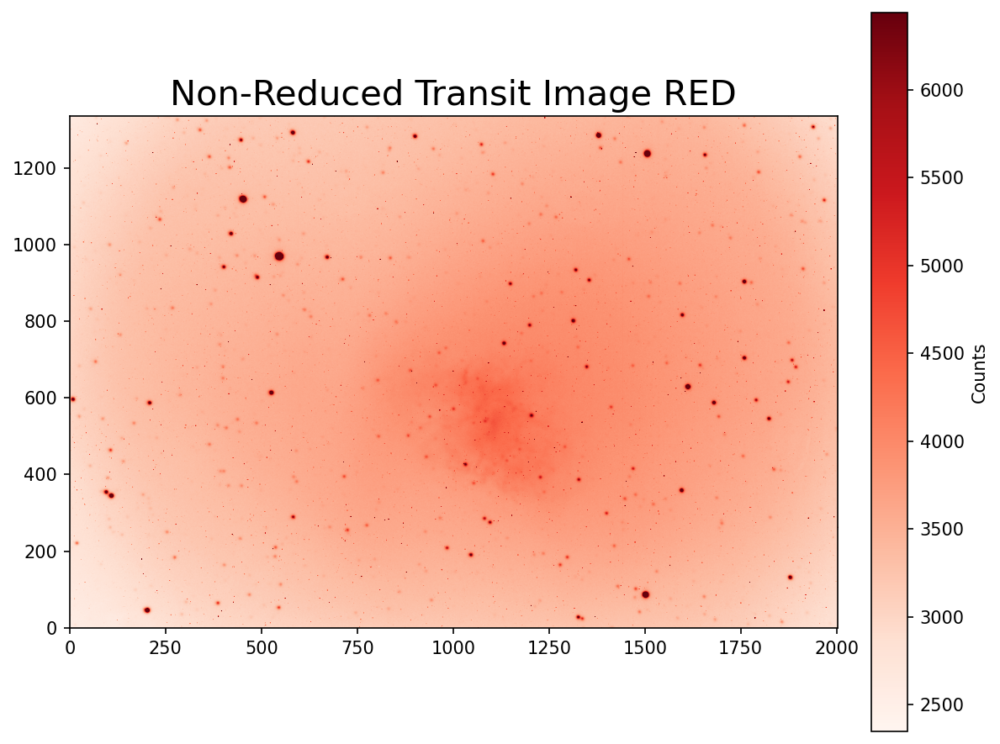

In [12]:
low  = np.percentile(transit_stack_red, 10) 
high = np.percentile(transit_stack_red, 99.9)

# create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(transit_stack_red[0], 
                vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Reds')


# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Non-Reduced Transit Image RED',fontsize=20)
plt.show()

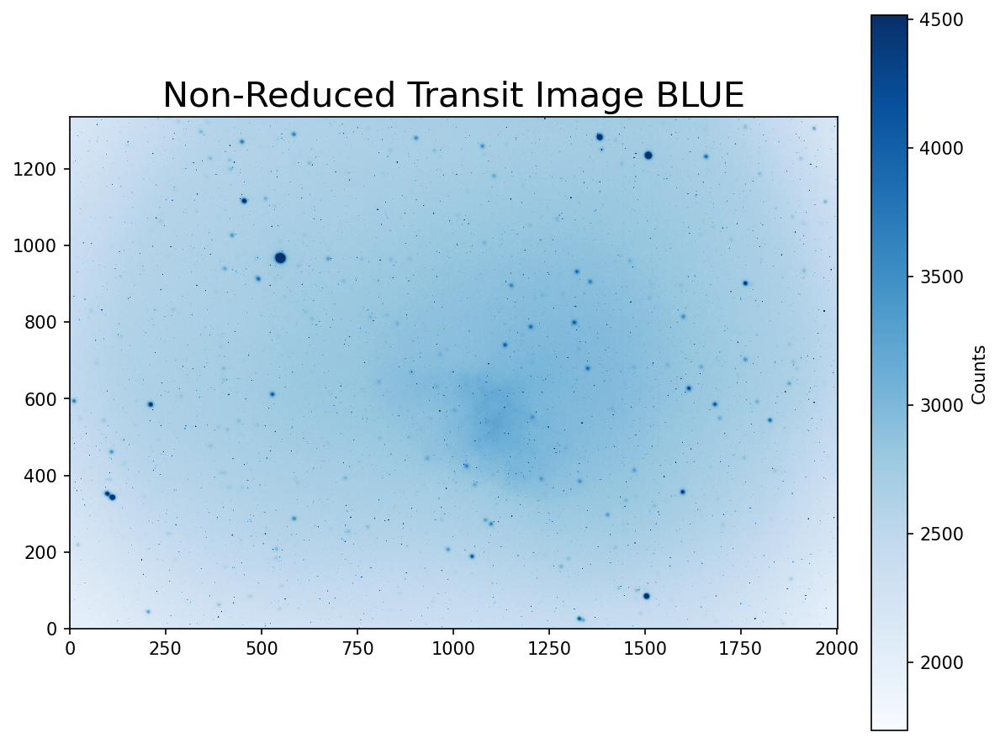

In [13]:
low  = np.percentile(transit_stack_blue, 10) 
high = np.percentile(transit_stack_blue, 99.9)

# create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(transit_stack_blue[0], 
                vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Blues')


# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Non-Reduced Transit Image BLUE',fontsize=20)
plt.show()

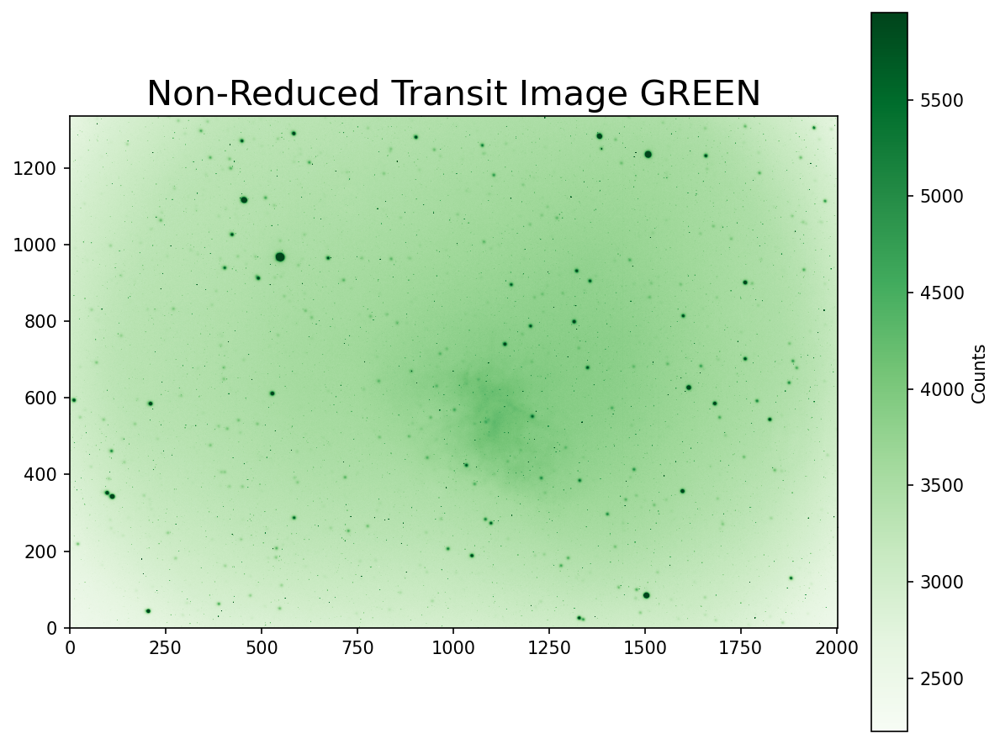

In [14]:
low  = np.percentile(transit_stack_green, 10) 
high = np.percentile(transit_stack_green, 99.9)

# create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(transit_stack_green[0], 
                vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Greens')


# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Non-Reduced Transit Image GREEN',fontsize=20)
plt.show()

## Making the Master Darks and Flats

In [15]:
darks_1s_median = np.median(darks_stack_1s, axis=0)
print(darks_1s_median.shape)

(1336, 2004)


In [16]:
hdu_darks_1s_exposure = fits.PrimaryHDU(darks_1s_median)
hdu_darks_1s_exposure.writeto('darks_1s_exposure_median.fits', overwrite = True)

In [17]:
darks_3m_median = np.median(darks_stack_3m, axis=0)
print(darks_3m_median.shape)

(1336, 2004)


In [18]:
hdu_darks_3m_exposure = fits.PrimaryHDU(darks_3m_median)
hdu_darks_3m_exposure.writeto('darks_3m_exposure_median.fits', overwrite = True)

### FLATS: Emma had something up on the board at one point that explained how to make a master flat, but I don't know if I interpretted it right, so i made two flats, one with her version and one that is just the median

In [19]:
flats_stack_norm_blue = np.zeros((len(flats_stack_blue), 1336, 2004))

for i in np.arange(0,len(flats_stack_blue)):
    flats_stack_norm_blue[i,:,:] = (flats_stack_blue[i,:,:] - darks_1s_median)/np.median(flats_stack_blue[i,:,:])

In [20]:
flats_master_blue = np.median(flats_stack_norm_blue, axis=0)
print(flats_master_blue.shape)

(1336, 2004)


In [21]:
hdu_flats_master_blue = fits.PrimaryHDU(flats_master_blue)
hdu_flats_master_blue.writeto('flats_master_blue.fits', overwrite = True )

In [22]:
flats_median_blue = np.median(flats_stack_blue, axis=0)
print(flats_median_blue.shape)

(1336, 2004)


In [23]:
hdu_flats_median_blue = fits.PrimaryHDU(flats_median_blue)
hdu_flats_median_blue.writeto('flats_median_blue.fits', overwrite = True)

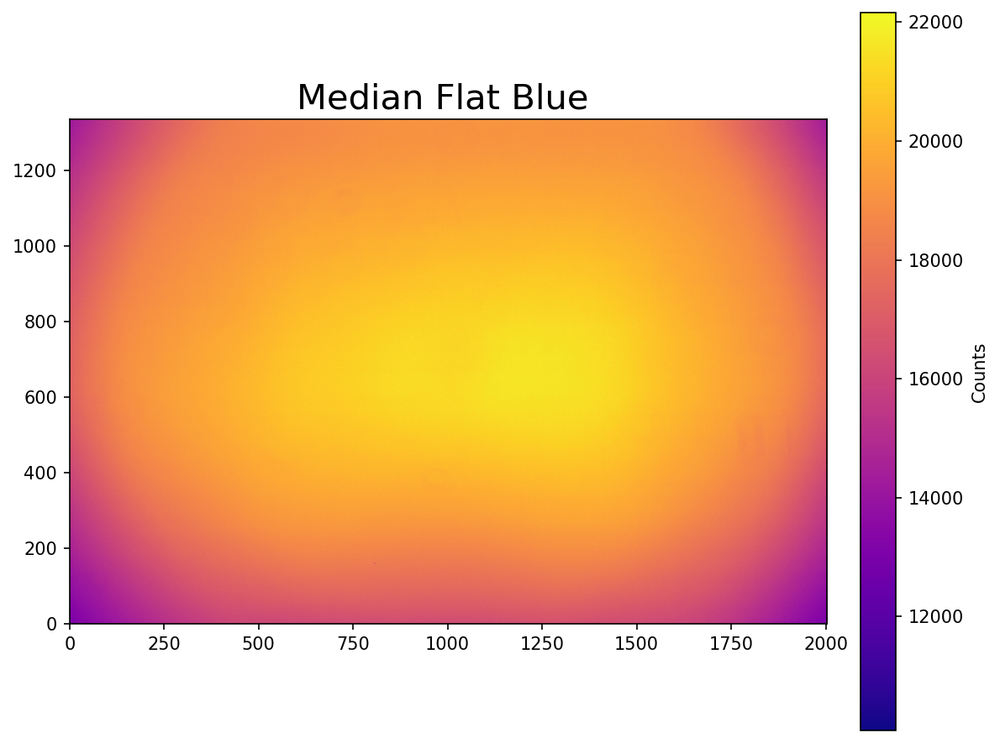

In [24]:
## create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(flats_median_blue, 
#                vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='plasma')


# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Median Flat Blue ',fontsize=20)
plt.show()

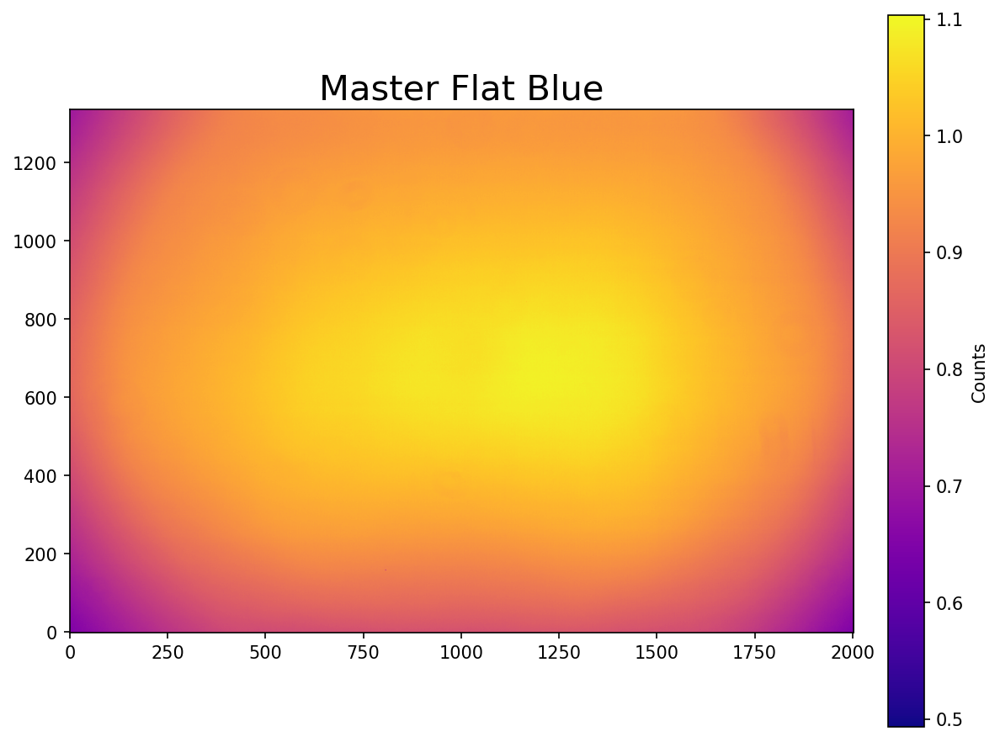

In [25]:
## create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(flats_master_blue, 
#                vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='plasma')


# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Master Flat Blue',fontsize=20)
plt.show()

In [26]:
flats_stack_norm_green = np.zeros((len(flats_stack_green), 1336, 2004))

for i in np.arange(0,len(flats_stack_green)):
    flats_stack_norm_green[i,:,:] = (flats_stack_green[i,:,:] - darks_1s_median)/np.median(flats_stack_green[i,:,:])

In [27]:
flats_master_green = np.median(flats_stack_norm_green, axis=0)
print(flats_master_green.shape)

(1336, 2004)


In [28]:
hdu_flats_master_green = fits.PrimaryHDU(flats_master_green)
hdu_flats_master_green.writeto('flats_master_green.fits', overwrite = True)

In [29]:
flats_median_green = np.median(flats_stack_green, axis=0)
print(flats_median_green.shape)

(1336, 2004)


In [30]:
hdu_flats_median_green = fits.PrimaryHDU(flats_median_green)
hdu_flats_median_green.writeto('flats_median_green.fits',overwrite = True)

In [31]:
flats_stack_norm_red = np.zeros((len(flats_stack_red), 1336, 2004))

for i in np.arange(0,len(flats_stack_red)):
    flats_stack_norm_red[i,:,:] = (flats_stack_red[i,:,:] - darks_1s_median)/np.median(flats_stack_red[i,:,:])

In [32]:
flats_master_red = np.median(flats_stack_norm_red, axis=0)
print(flats_master_red.shape)

(1336, 2004)


In [33]:
hdu_flats_master_red = fits.PrimaryHDU(flats_master_red)
hdu_flats_master_red.writeto('flats_master_red.fits', overwrite = True)

In [34]:
flats_median_red = np.median(flats_stack_red, axis=0)
print(flats_median_red.shape)

(1336, 2004)


In [35]:
hdu_flats_median_red = fits.PrimaryHDU(flats_median_red)
hdu_flats_median_red.writeto('flats_median_red.fits',overwrite = True)

## Reduced Image with MASTER FLAT

In [36]:
reduced_transit_stack_red = np.zeros((len(transit_stack_red), 1336, 2004))

for i in np.arange(0,len(transit_stack_red)):
    reduced_transit_stack_red[i,:,:] = (transit_stack_red[i,:,:] - darks_3m_median)/(flats_master_red)
            

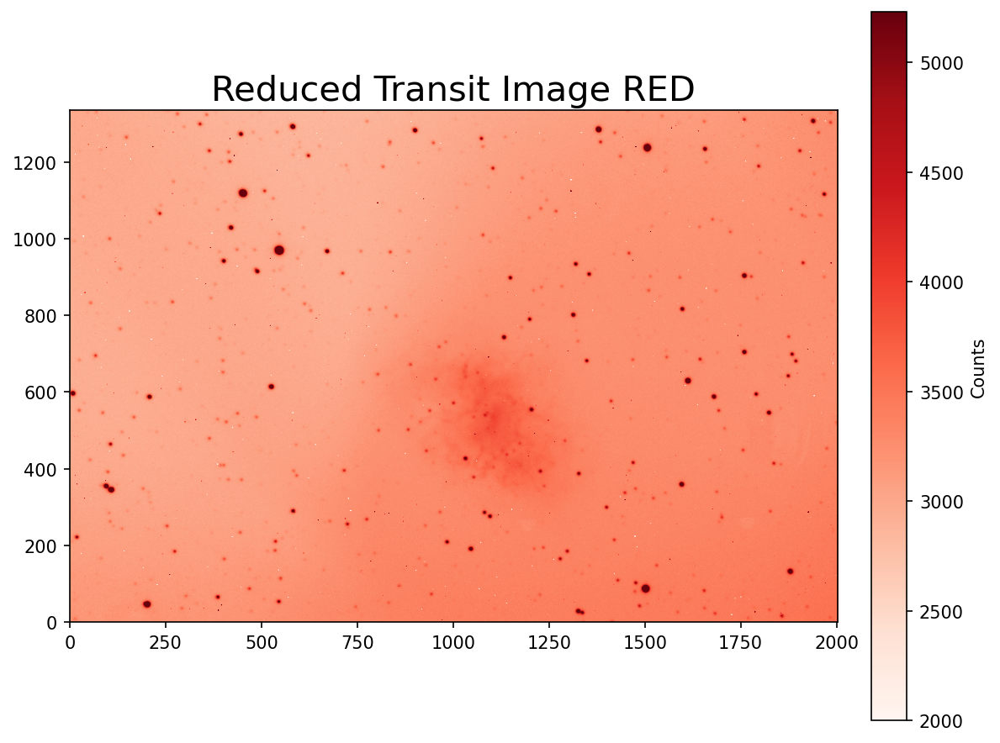

In [37]:
low  = np.percentile(reduced_transit_stack_red, 10) 
high = np.percentile(reduced_transit_stack_red, 99.9)

# create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(reduced_transit_stack_red[0], 
                vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Reds')


# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Reduced Transit Image RED',fontsize=20)
plt.show()

In [38]:
reduced_transit_stack_green = np.zeros((len(transit_stack_green), 1336, 2004))

for i in np.arange(0,len(transit_stack_green)):
    reduced_transit_stack_green[i,:,:] = (transit_stack_green[i,:,:] - darks_3m_median)/(flats_master_green)

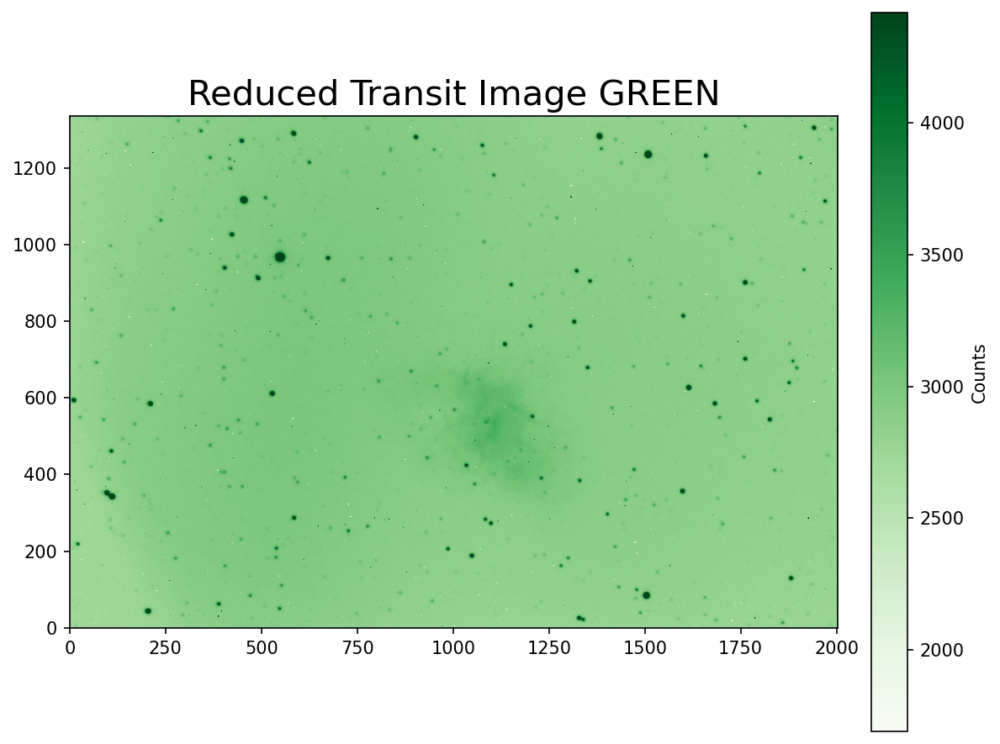

In [39]:
low  = np.percentile(reduced_transit_stack_green, 10) 
high = np.percentile(reduced_transit_stack_green, 99.9)

# create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(reduced_transit_stack_green[0], 
                vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Greens')


# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Reduced Transit Image GREEN',fontsize=20)
plt.show()

In [40]:
reduced_transit_stack_blue = np.zeros((len(transit_stack_blue), 1336, 2004))

for i in np.arange(0,len(transit_stack_blue)):
    reduced_transit_stack_blue[i,:,:] = (transit_stack_blue[i,:,:] - darks_3m_median)/(flats_master_blue)

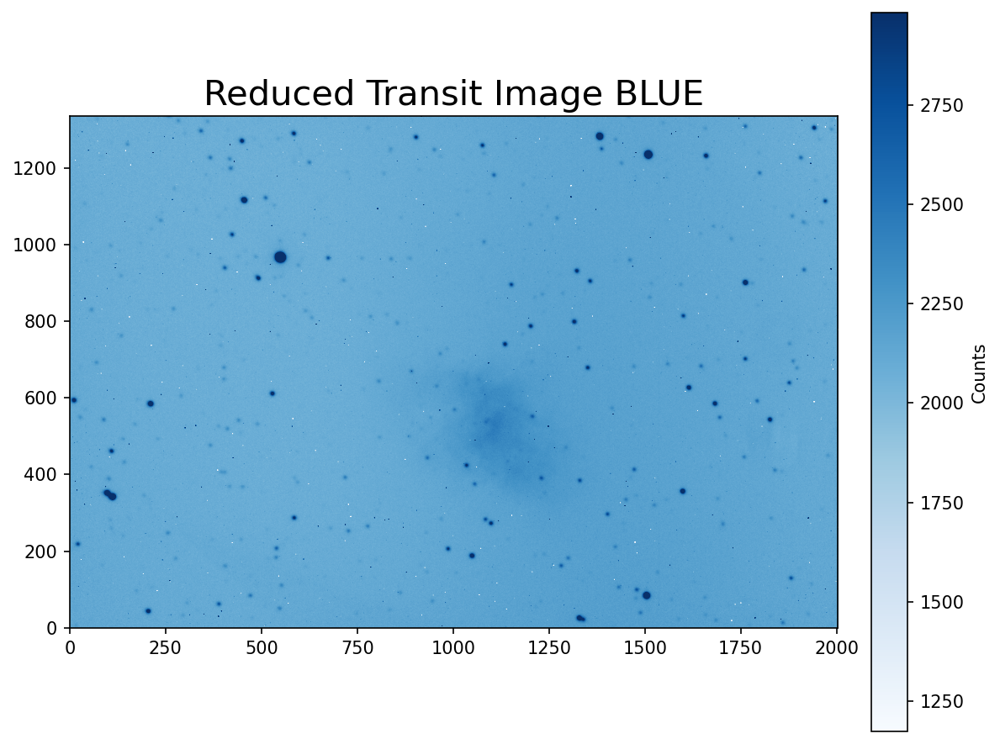

In [41]:
low  = np.percentile(reduced_transit_stack_blue, 10) 
high = np.percentile(reduced_transit_stack_blue, 99.9)

# create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(reduced_transit_stack_blue[0], 
                vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Blues')


# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Reduced Transit Image BLUE',fontsize=20)
plt.show()

In [42]:
hdu_reduced_red = fits.PrimaryHDU(reduced_transit_stack_red)
hdu_reduced_red.writeto('reduced_transit_stack_red.fits', overwrite = True)

In [43]:
hdu_reduced_green = fits.PrimaryHDU(reduced_transit_stack_green)
hdu_reduced_green.writeto('reduced_transit_stack_green.fits', overwrite = True)

In [44]:
hdu_reduced_blue = fits.PrimaryHDU(reduced_transit_stack_blue)
hdu_reduced_blue.writeto('reduced_transit_stack_blue.fits', overwrite = True)

In [45]:
from skimage import img_as_ubyte, img_as_uint, img_as_float64

In [46]:
reduced_red_test = img_as_float64(reduced_transit_stack_red[0])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


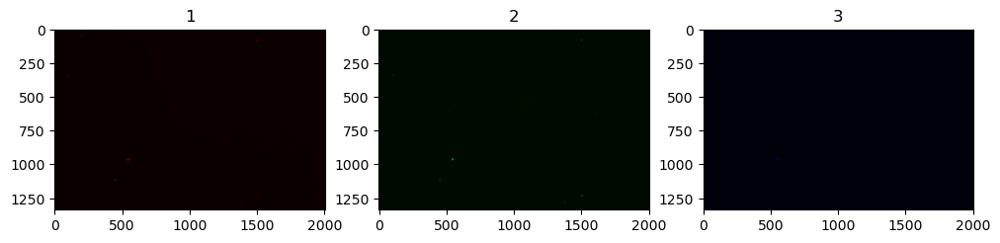

In [47]:
nx,ny = reduced_transit_stack_blue[0].shape
only1 = np.zeros([nx,ny,3],dtype=np.float64)
only2 = np.zeros([nx,ny,3],dtype=np.float64)
only3 = np.zeros([nx,ny,3],dtype=np.float64)

test_red = reduced_transit_stack_red[0]/np.max(reduced_transit_stack_red[0])
test_green = reduced_transit_stack_green[0]/np.max(reduced_transit_stack_green[0])
test_blue = reduced_transit_stack_blue[0,]/np.max(reduced_transit_stack_blue[0])


for i in range(0, nx):
    for j in range(0,ny):
        only1[i,j,0] = test_red[i,j]
        only2[i,j,1] = test_green[i,j]
        only3[i,j,2] = test_blue[i,j]
        

        
fig, axs = plt.subplots(1, 3, figsize=(12, 4))


axs[0].imshow(only1,cmap='gray')
axs[0].set_title('1')

axs[1].imshow(only2,cmap='gray')
axs[1].set_title('2')

axs[2].imshow(only3,cmap='gray')
axs[2].set_title('3')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


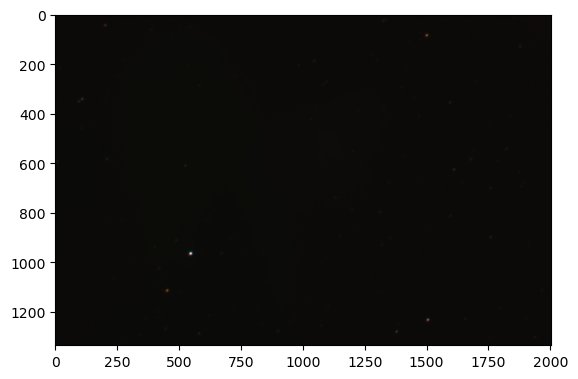

In [48]:
ls_rgb = np.zeros([nx,ny,3],dtype=np.float64)

for i in range(0, nx):
    for j in range(0,ny):
        ls_rgb[i,j,0] = test_red[i,j]
        ls_rgb[i,j,1] = test_green[i,j]
        ls_rgb[i,j,2] = test_blue[i,j]
    
plt.imshow(ls_rgb)
plt.show()

In [49]:
from skimage.filters.rank import entropy
from skimage.color import rgb2gray
from skimage.color import label2rgb
from skimage import io
from skimage.morphology import disk, erosion, dilation, opening, closing
from skimage import measure
from skimage import img_as_ubyte, img_as_uint, img_as_float64
from image_manipulation import plot_channel_intensities
from skimage.transform import rotate

import matplotlib.pyplot as plt
import numpy as np

from image_manipulation import prepare_landsat_image
from PIL import Image
from image_manipulation import bar_plot_with_colors
from image_manipulation import rescale_intensities

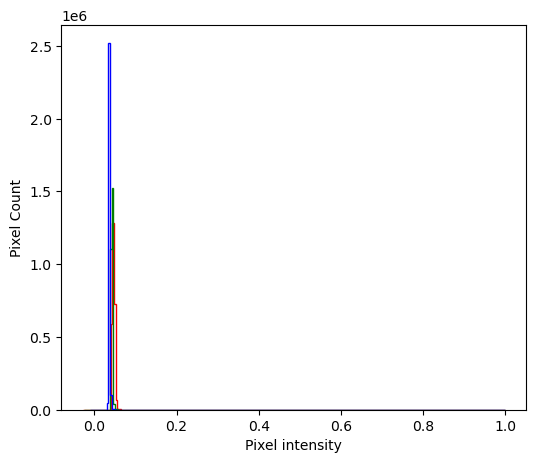

In [50]:
plot_channel_intensities(ls_rgb)
plt.show()

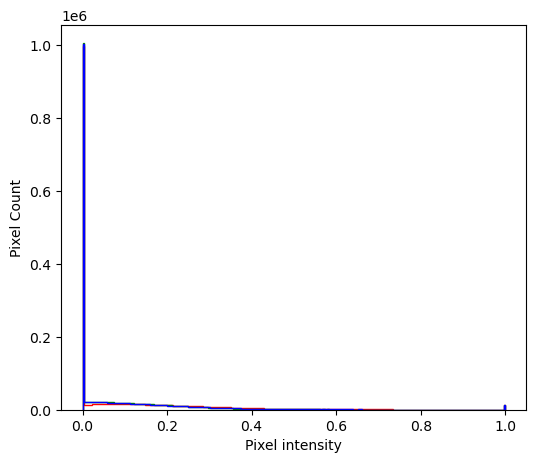

In [51]:
flow = 50
fhigh = 99.5
ls_rgb_rescale = rescale_intensities(ls_rgb,flow,fhigh)
plot_channel_intensities(ls_rgb_rescale)
plt.show()

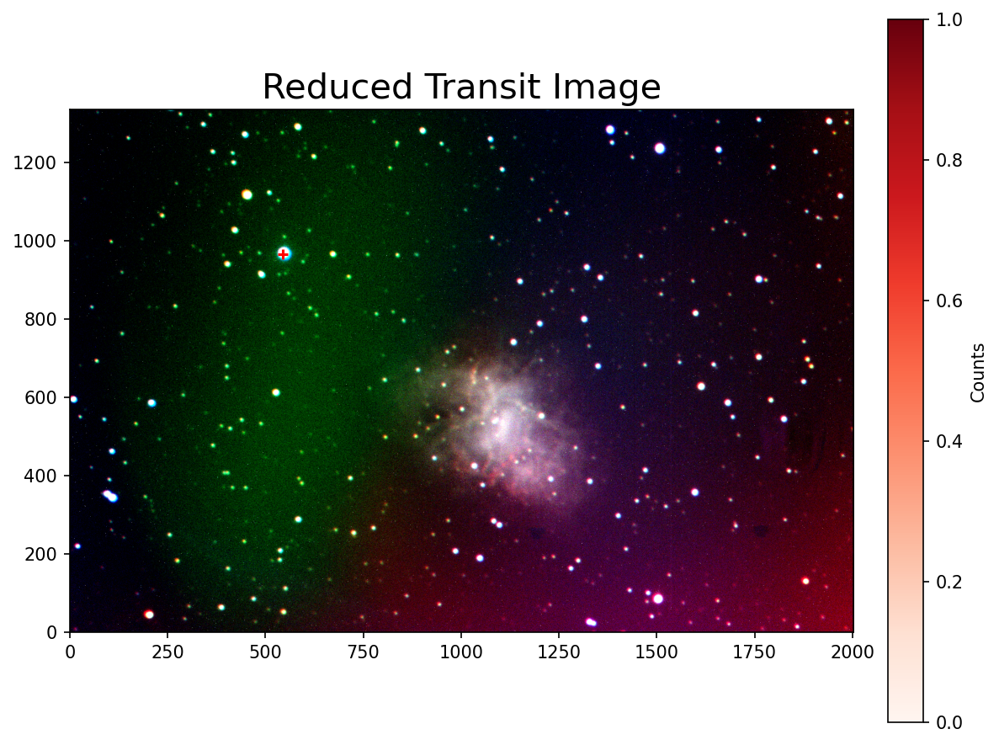

In [52]:
low  = np.percentile(ls_rgb_rescale, 10) 
high = np.percentile(ls_rgb_rescale, 99.9)

# create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(ls_rgb_rescale,
                vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Reds')
plt.scatter(545, 965, marker='+', color='red')


# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Reduced Transit Image',fontsize=20)
plt.show()

In [53]:
zoomed_image.shape

zoomed_image = np.zeros([500,700])

zoomed_image[:,:] = ls_rgb_rescale[100:600,50:750,1]

plt.imshow(zoomed_image)

NameError: name 'zoomed_image' is not defined

In [54]:
ls_rgb_rescale.shape


(1336, 2004, 3)

In [55]:
track_star_blue = np.zeros((len(reduced_transit_stack_blue), 90, 90))
track_star_red = np.zeros((len(reduced_transit_stack_red), 90, 90))
track_star_green = np.zeros((len(reduced_transit_stack_green), 90, 90))



for image_number in np.arange(0,len(reduced_transit_stack_blue)):
    new_image = reduced_transit_stack_blue[image_number,965-45:965+45,545-45:545+45]
    track_star_blue [image_number,:,:] = new_image
    new_image = reduced_transit_stack_red[image_number,965-45:965+45,545-45:545+45]
    track_star_red[image_number,:,:] = new_image
    new_image = reduced_transit_stack_green[image_number,965-45:965+45,545-45:545+45]
    track_star_green[image_number,:,:] = new_image

In [56]:
#get the center of each star
threshold=3000

y_centers_red = np.array([])
x_centers_red = np.array([])

y_centers_green = np.array([])
x_centers_green = np.array([])

y_centers_blue = np.array([])
x_centers_blue = np.array([])

for i in range(len(track_star_blue)):
    max_pix_y, max_pix_x = np.where(track_star_red[i,:,:] > threshold)
    y_center = int(math.ceil(np.median(max_pix_y)))
    x_center = int(math.ceil(np.median(max_pix_x)))
    y_centers_red = np.append(y_centers_red, y_center)
    x_centers_red = np.append(x_centers_red, x_center)
    
    max_pix_y, max_pix_x = np.where(track_star_blue[i,:,:] > threshold)
    y_center = int(math.ceil(np.median(max_pix_y)))
    x_center = int(math.ceil(np.median(max_pix_x)))
    y_centers_blue = np.append(y_centers_blue, y_center)
    x_centers_blue = np.append(x_centers_blue, x_center)
    
    max_pix_y, max_pix_x = np.where(track_star_green[i,:,:] > threshold)
    y_center = int(math.ceil(np.median(max_pix_y)))
    x_center = int(math.ceil(np.median(max_pix_x)))
    y_centers_green = np.append(y_centers_green, y_center)
    x_centers_green = np.append(x_centers_green, x_center)

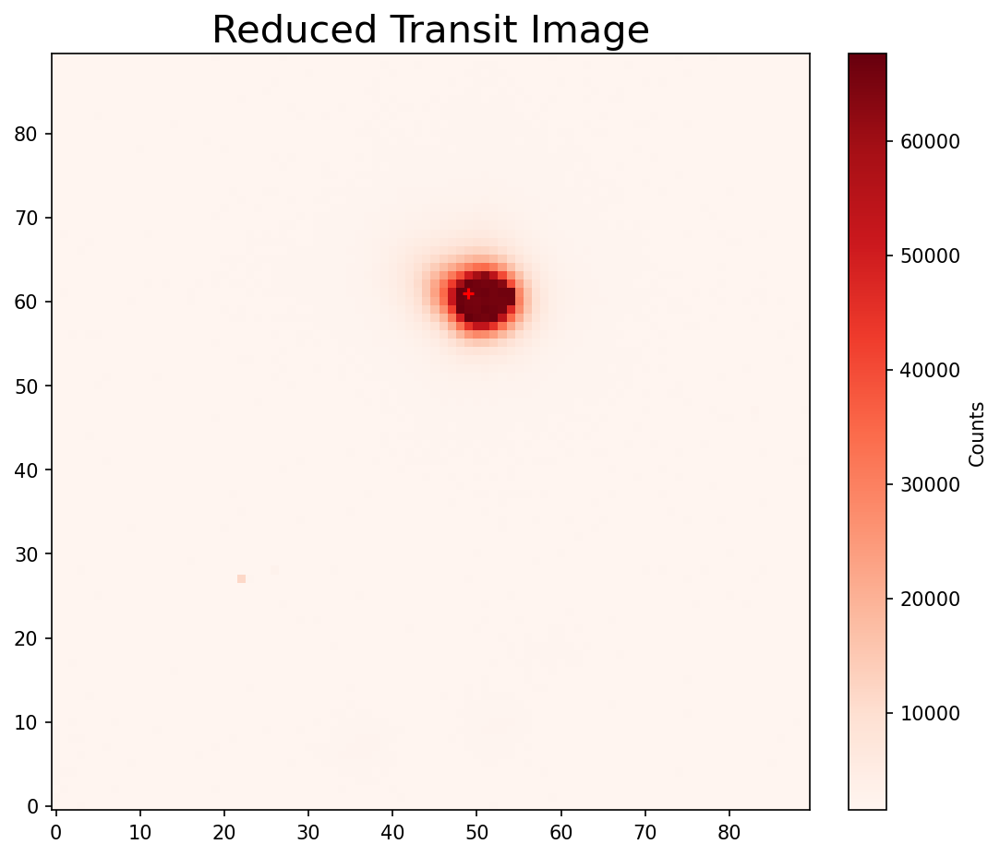

In [57]:

# create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(track_star_green[4], 
  #              vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Reds')

plt.scatter(x_centers_green[4], y_centers_green[4], marker='+', color='red')



# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Reduced Transit Image',fontsize=20)
plt.show()

In [58]:
##use the center of the star as a marker for new image
## 900 by 1100

In [60]:
realigned_blue = np.zeros((len(reduced_transit_stack_blue), 900, 1100))
realigned_red = np.zeros((len(reduced_transit_stack_red), 900, 1100))
realigned_green = np.zeros((len(reduced_transit_stack_green), 900, 1100))


In [76]:
for i in np.arange(0,len(reduced_transit_stack_blue)):
    ylim = 920 + y_centers_blue[i] - 900
    ylim2 = 920 + y_centers_blue[i]
    xlim = 500 + x_centers_blue[i]
    xlim2 = 500 + x_centers_blue[i] + 1100

    realigned_blue[i,:,:] = reduced_transit_stack_blue[i, int(ylim):int(ylim2), int(xlim):int(xlim2) ]
    
    ylim = 920 + y_centers_red[i] - 900
    ylim2 = 920 + y_centers_red[i]
    xlim = 500 + x_centers_red[i]
    xlim2 = 500 + x_centers_red[i] + 1100

    realigned_red[i,:,:] = reduced_transit_stack_red[i, int(ylim):int(ylim2), int(xlim):int(xlim2) ]
    
    ylim = 920 + y_centers_green[i] - 900
    ylim2 = 920 + y_centers_green[i]
    xlim = 500 + x_centers_green[i]
    xlim2 = 500 + x_centers_green[i] + 1100

    realigned_green[i,:,:] = reduced_transit_stack_green[i, int(ylim):int(ylim2), int(xlim):int(xlim2) ]

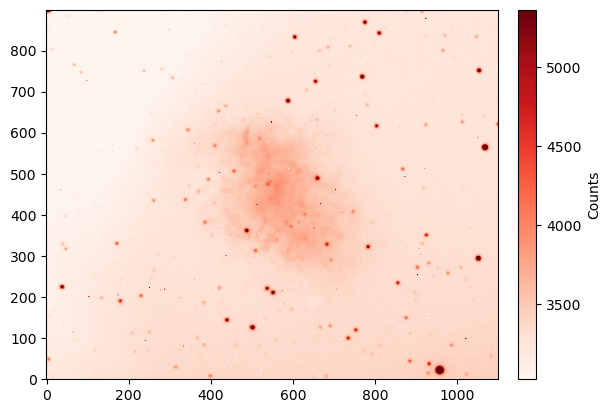

In [85]:
low  = np.percentile(realigned_red[0], 10) 
high = np.percentile(realigned_red[0], 99.9)


im = plt.imshow(realigned_red[0], 
              vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Reds')

plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')

In [83]:
final_image_blue = np.median(realigned_blue, axis=0)
final_image_red = np.median(realigned_red, axis=0)
final_image_green = np.median(realigned_green, axis=0)

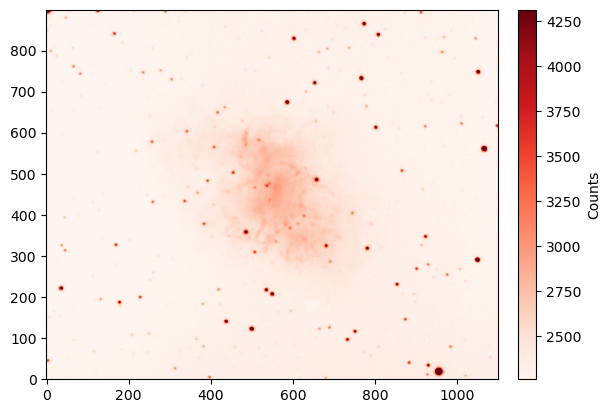

In [86]:
low  = np.percentile(final_image_red, 20) 
high = np.percentile(final_image_red, 99.9)


im = plt.imshow(final_image_red, 
              vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Reds')

plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')

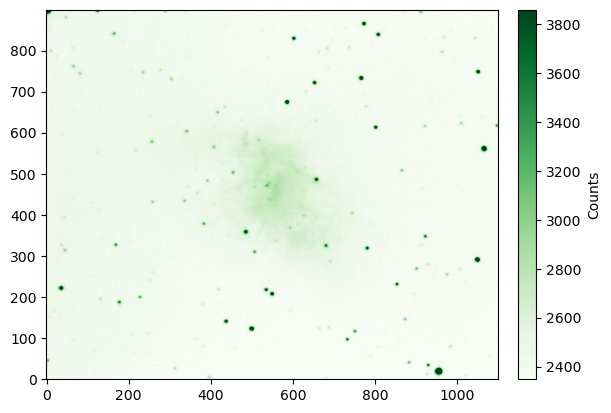

In [89]:
low  = np.percentile(final_image_green, 20) 
high = np.percentile(final_image_green, 99.9)


im = plt.imshow(final_image_green, 
              vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Greens')

plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')

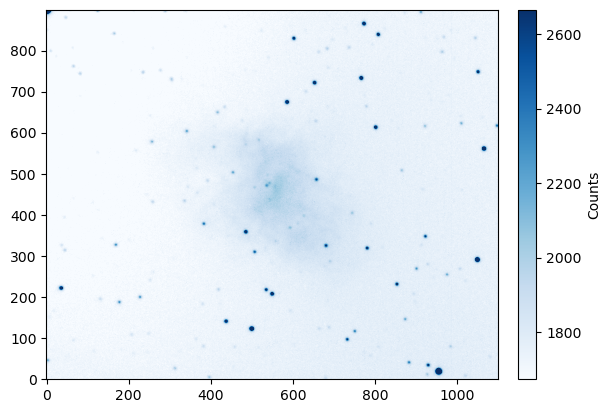

In [90]:
low  = np.percentile(final_image_blue, 20) 
high = np.percentile(final_image_blue, 99.9)


im = plt.imshow(final_image_blue, 
              vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Blues')

plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')

In [ ]:
low  = np.percentile(ls_rgb_rescale, 10) 
high = np.percentile(ls_rgb_rescale, 99.9)

# create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(ls_rgb_rescale,
                vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Reds')
plt.scatter(545, 965, marker='+', color='red')


# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Reduced Transit Image',fontsize=20)
plt.show()

In [92]:
nx,ny = final_image_blue.shape

final_scale_blue = final_image_blue/np.max(final_image_blue)
final_scale_red = final_image_red/np.max(final_image_red)
final_scale_green = final_image_green/np.max(final_image_green)


deep = np.zeros([nx,ny,3],dtype=np.float64)

for i in range(0, nx):
    for j in range(0,ny):
        deep[i,j,0] = final_scale_red[i,j]
        deep[i,j,1] = final_scale_green[i,j]
        deep[i,j,2] = final_scale_blue[i,j]


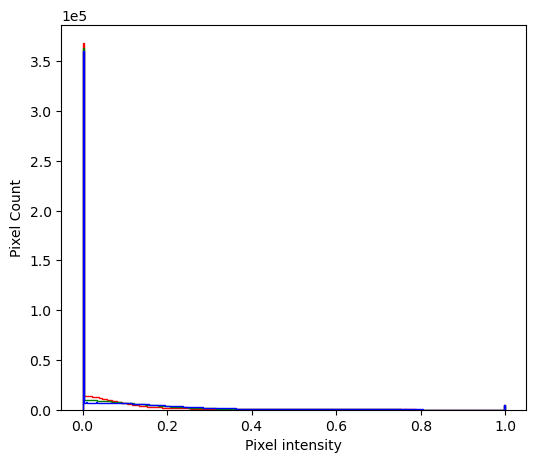

In [108]:
flow = 50
fhigh = 99.5
deep_rescale = rescale_intensities(deep,flow,fhigh)
plot_channel_intensities(deep_rescale)
plt.show()

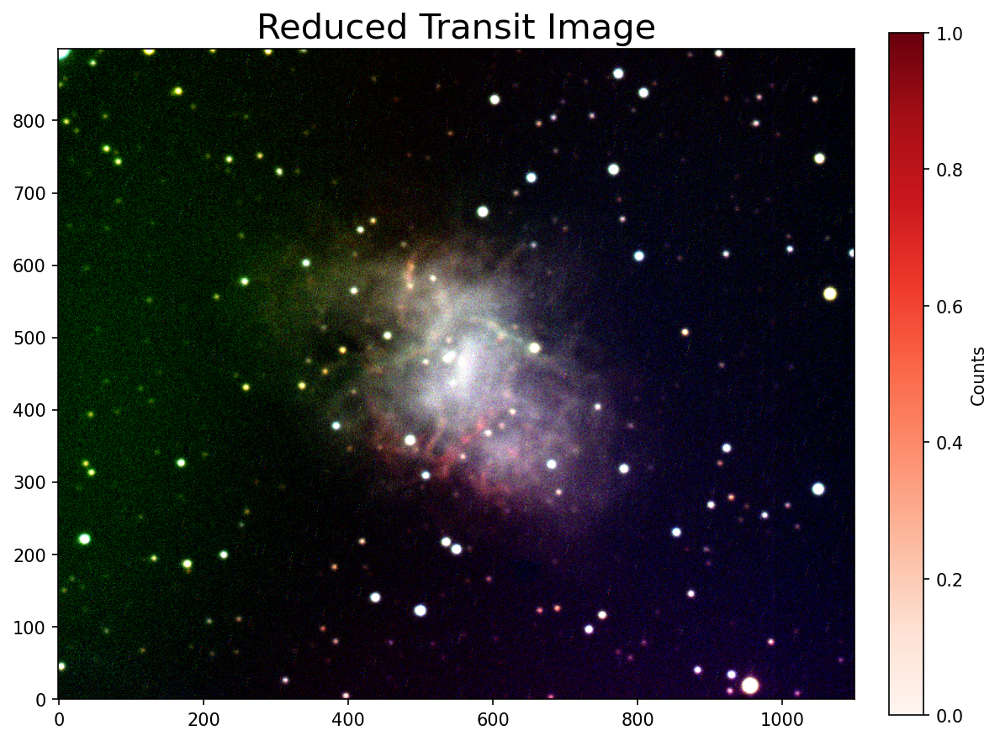

In [109]:
low  = np.percentile(deep_rescale, 10) 
high = np.percentile(deep_rescale, 99.9)

# create figure object
plt.figure(figsize=[8,6],dpi=150)

# plot the image
im = plt.imshow(deep_rescale,
                vmin=low,vmax=high,
#                norm=mpl.colors.LogNorm(),
                origin='lower',cmap='Reds')



# colorbar and aestheticcs
plt.colorbar(im,
             fraction=0.046, 
             pad=0.04,
             label='Counts')
plt.tight_layout()
plt.title('Reduced Transit Image',fontsize=20)
plt.show()